### This notebook explores peak finding on our MgO dataset.

In [6]:
#!mv cache/xrd oldxrd

In [1]:
from dataccess.nbfunctions import *

import os
from threading import Timer
from ipyparallel import Client


def bashrun(cmd):
    import subprocess
    return subprocess.check_output(cmd, shell=True)

def batch_submit(cmd, ncores = 6, queue = 'psfehq'):
    return bashrun(r'bsub -n {0} -q {1} -o batch_logs/%J.log mpirun '.format(ncores, queue) + cmd)

def ipcluster_submit(name, ncores = 6, queue = 'psfehq'):
    """Launch an ipcluster in MPI mode as a batch job"""
    return batch_submit(r"ipcluster start --n={0} --profile={1} --ip='*' --engines=MPI".format(ncores, name), ncores = ncores, queue = queue)

def bjobs_count(queue_name):
    return int(bashrun('bjobs -q %s -u all -p | wc -l' % queue_name))

class Bqueue:
    sizes = {'psanaq': 960., 'psfehq': 288., 'psnehq': 288.}
    def __init__(self, name):
        self.name = name
        if name == 'psfehq' or name == 'psnehq':
            self.upstream_q = Bqueue(name[:-1] + 'hiprioq')
        else:
            self.upstream_q = None
        
    def number_pending(self):
        if self.upstream_q is not None:
            return bjobs_count(self.name) + bjobs_count(self.upstream_q.name)
        else:
            return bjobs_count(self.name)
        
    def key(self):
        """
        Sorting key for this class.
        """
        return self.number_pending()/Bqueue.sizes[self.name]

def best_queue(usable_queues):
    """Return the name of the least-subscribed batch queue"""
    return min(usable_queues, key = lambda q: q.key())

usable_queues = map(Bqueue, ('psanaq', 'psfehq', 'psnehq'))

def preprocess_one(run_number, cores = 1):
    os.system(r'bsub -a mympi -n {0} -q {1} -o batch_logs/%J.log mecana.py -n datashow quad2 {2}'.format(
              cores, best_queue(usable_queues), run_number))
    
def preprocess_xrd(ds, cores = 1):
    import os
    [preprocess_one(run) for run in ds.runs]
    os.system(r'bsub -a mympi -n {0} -q {1} -o batch_logs/%J.log mecana.py -n xrd quad2 -l {2} -n peak -b'.format(
              cores, best_queue(usable_queues), ds.label))
    
from dataccess.datashow import show



In [2]:
MgO_ref_short_clean = [get_query_dataset('material MgO runs 870 961 transmission 1. focal_size %d' % spotsize,
                                'MgO.ref.1C.short2.%sum' % spotsize, print_enable = False)
                                for spotsize in [4, 8, 18, 38, 48, 58]]
MgO_ref_short = [get_query_dataset('material MgO runs 870 961 transmission 1. focal_size %d' % spotsize,
                                'MgO.ref.1C.short2.%sum' % spotsize, print_enable = False)
                                for spotsize in [4, 8, 18, 28, 38, 48, 58]]
# One of the 2 um runs is garbage, so we select the good one by run number:
MgO_ref_short.insert(0, get_query_dataset('runs 906 906', 'MgO.ref.1C.short2um', print_enable = False)) 

from dataccess import peakfinder
r567 = query.DataSet([567], label = 'r567')

def filtfunc(arr):
    base = np.median(arr)
    return peakfinder.consolidate_peaks(arr, thr_low = base + 10, thr_high = base + 10, radius = 10)

def filtfunc2(arr):
    base = np.median(arr)
    return peakfinder.consolidate_peaks(arr, thr_low = base + 6, thr_high = base + 10, radius = 10)

r916 = query.DataSet([916], label = 'r916_2')

[ds.runs for ds in MgO_ref_short_clean]

In [ ]:
from xraycam.decluster import do_decluster_32

def sanitize_arr(arr):
    offset = np.percentile(arr, 10)
    cut = arr.copy() - offset
    cut[cut < 0] = 0
    return cut.astype(np.uint32)

def decluster_filt(arr):
    cut = sanitize_arr(arr)
    return do_decluster_32(cut, 10 + int(np.percentile(cut, 50)))

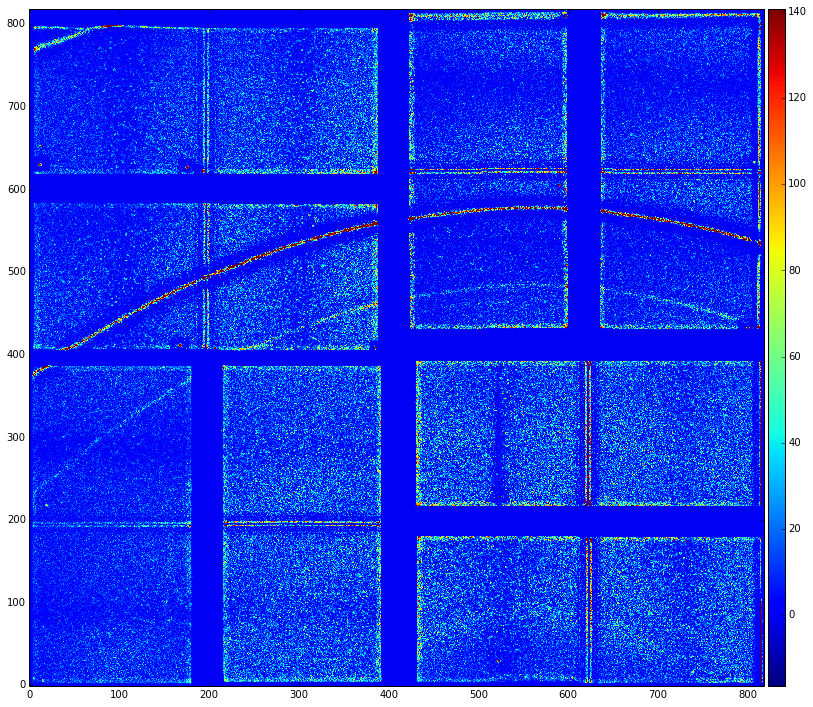

In [7]:
q2 = r916.evaluate('quad2', frame_processor = filtfunc)
utils.show_image(q2.mean)

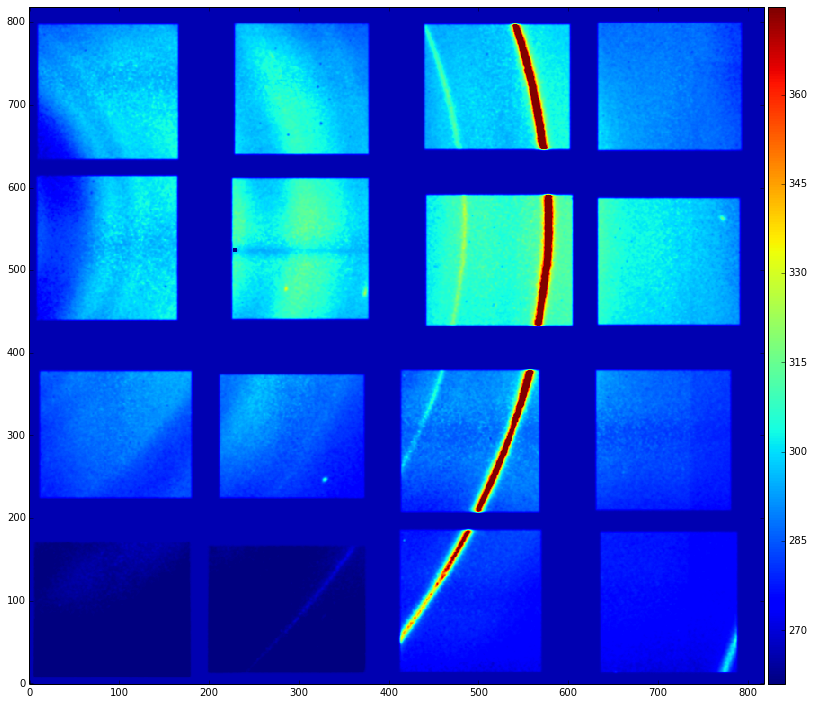

In [3]:
plot_xrd([r916], compound_list = ['MgO'], normalization = None, bgsub = False, plot_patterns = True)

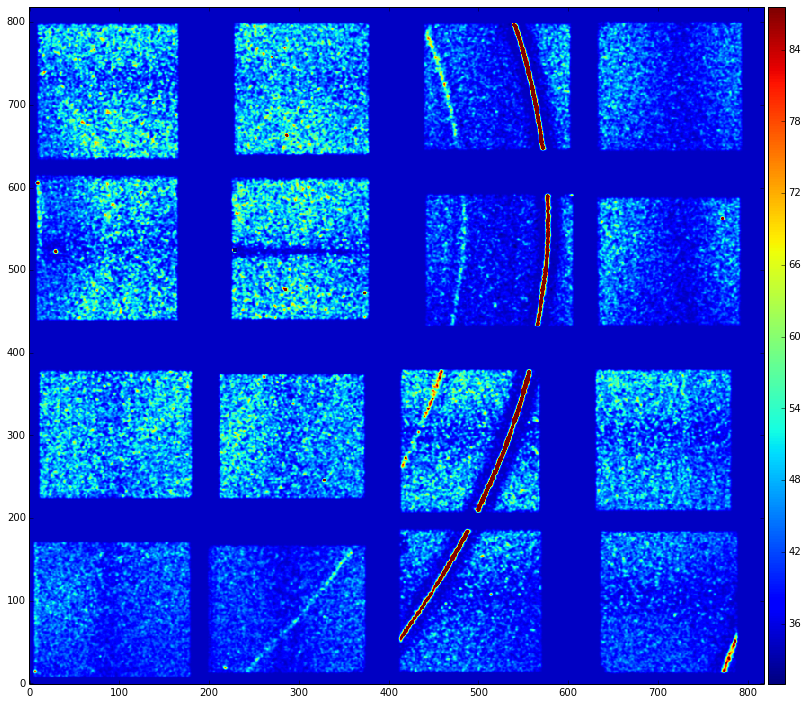

In [4]:
plot_xrd([r916], compound_list = ['MgO'], normalization = None, bgsub = False, plot_patterns = True, frame_processor = filtfunc)

### Compare with and without peak-finding:

In [5]:
_, ax = xrd.plt.subplots()
plot_xrd([r916], compound_list = ['MgO'], normalization = None, bgsub = False, plot_patterns = True, show = False, show_image = False, frame_processor = filtfunc, ax = ax)
plot_xrd([r916], compound_list = ['MgO'], normalization = None, bgsub = False, show_image = False, plot_patterns = True, ax = ax)

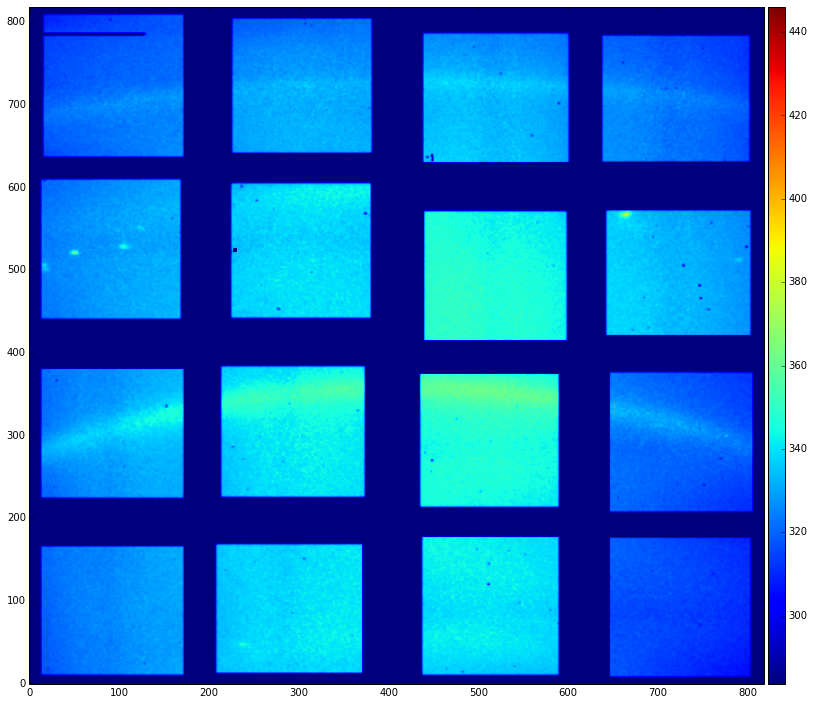

In [6]:
plot_xrd([r916], compound_list = ['MgO'], detectors = ['quad1'], normalization = None, bgsub = False, plot_patterns = True)

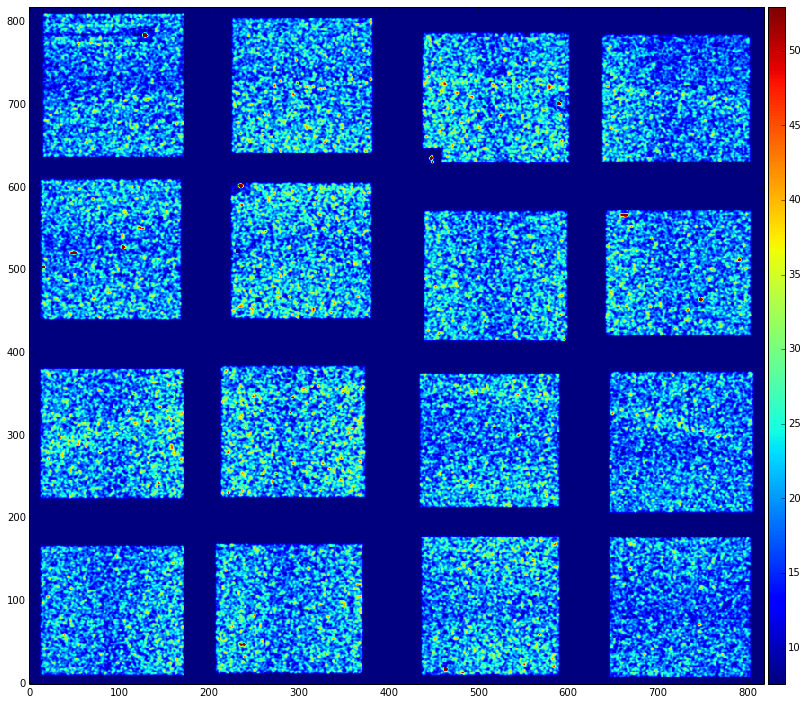

In [19]:
plot_xrd([r916], compound_list = ['MgO'], detectors = ['quad1'], normalization = None, bgsub = False, plot_patterns = True, frame_processor = filtfunc)

In [21]:
_, ax = xrd.plt.subplots()
plot_xrd([r916], compound_list = ['MgO'], detectors = ['quad1'], normalization = None, bgsub = False, plot_patterns = True, show = False, show_image = False, frame_processor = filtfunc, ax = ax)
plot_xrd([r916], compound_list = ['MgO'], detectors = ['quad1'], normalization = None, bgsub = False, show_image = False, plot_patterns = True, ax = ax)

### Run powder plots for all datasets. Start with quad2 (downstream)

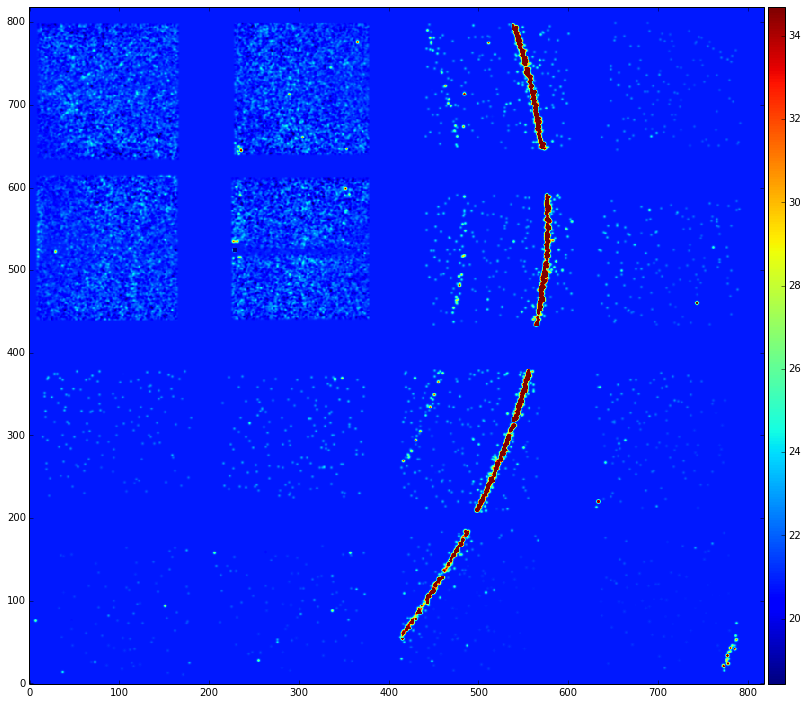

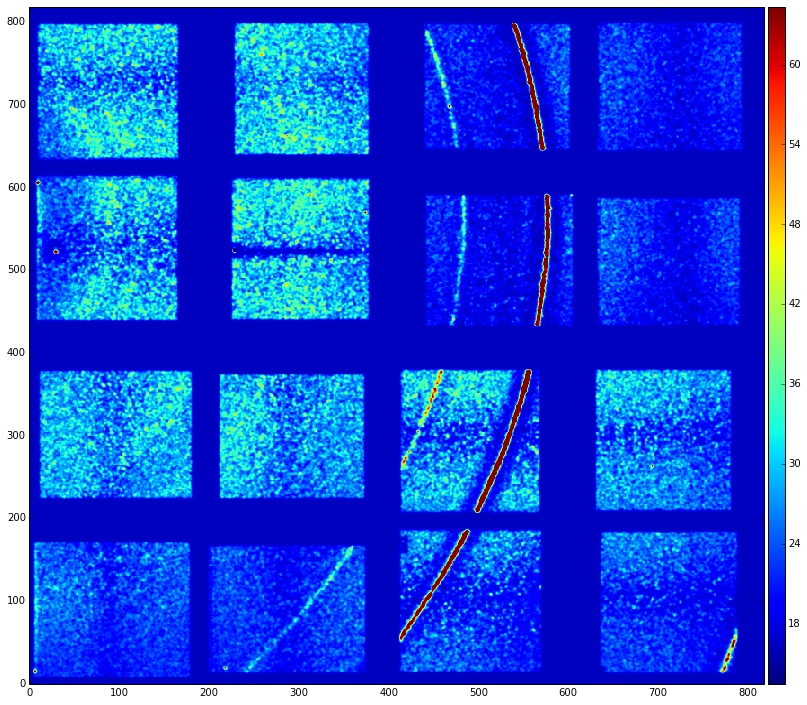

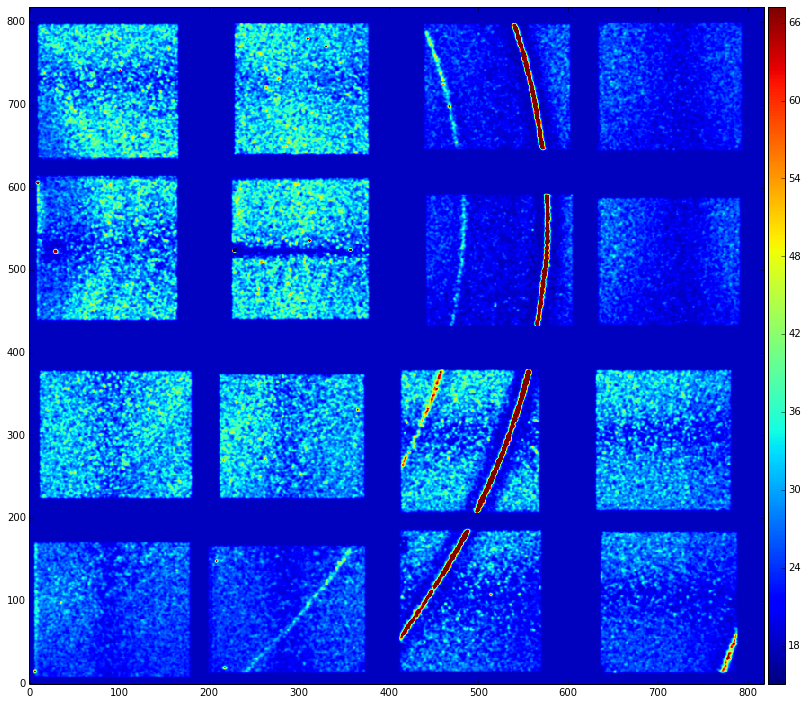

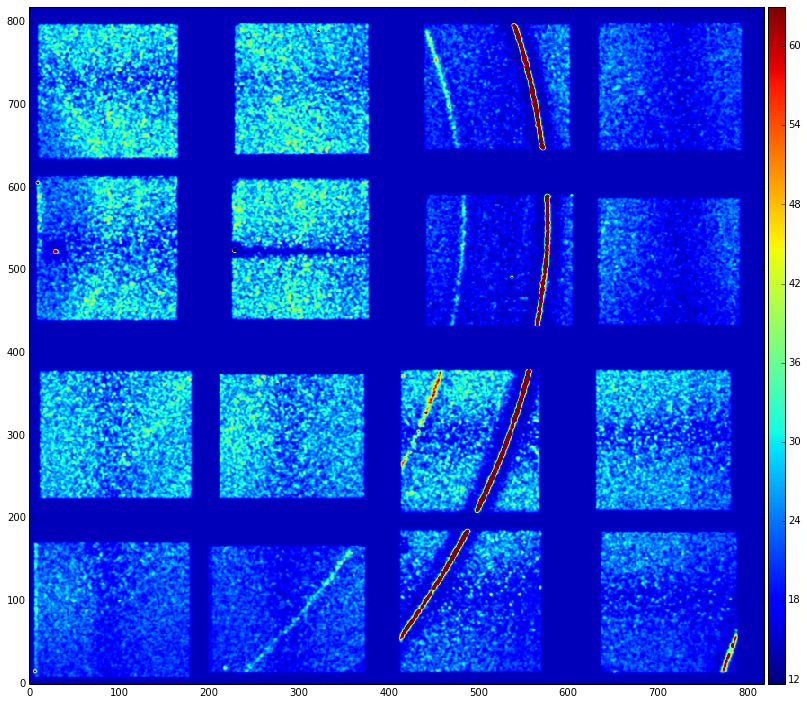

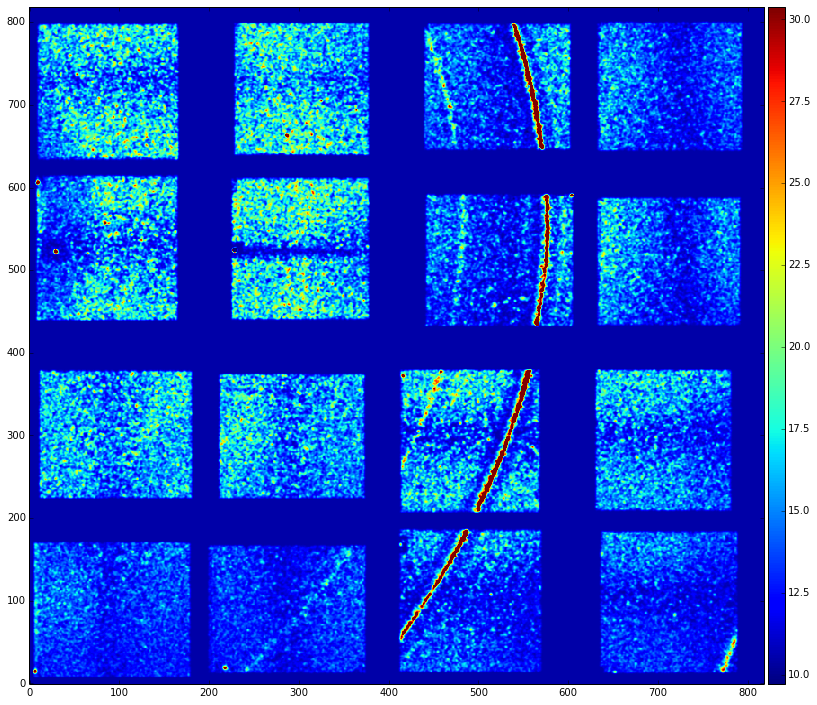

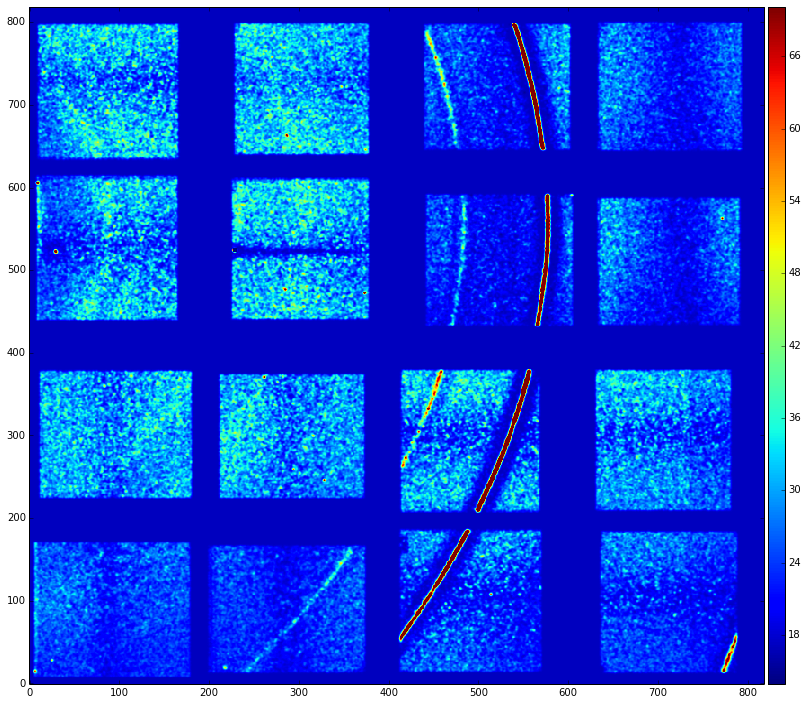

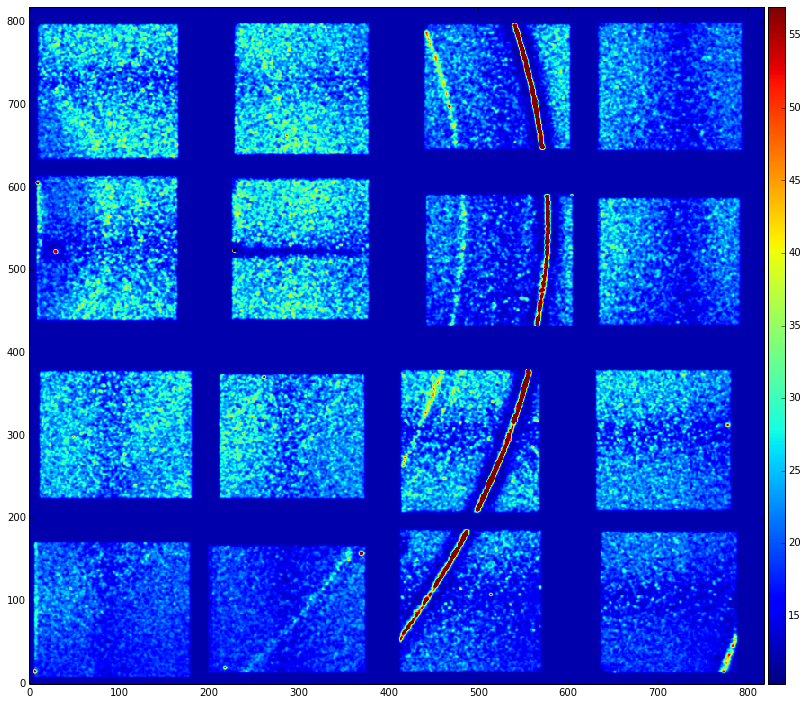

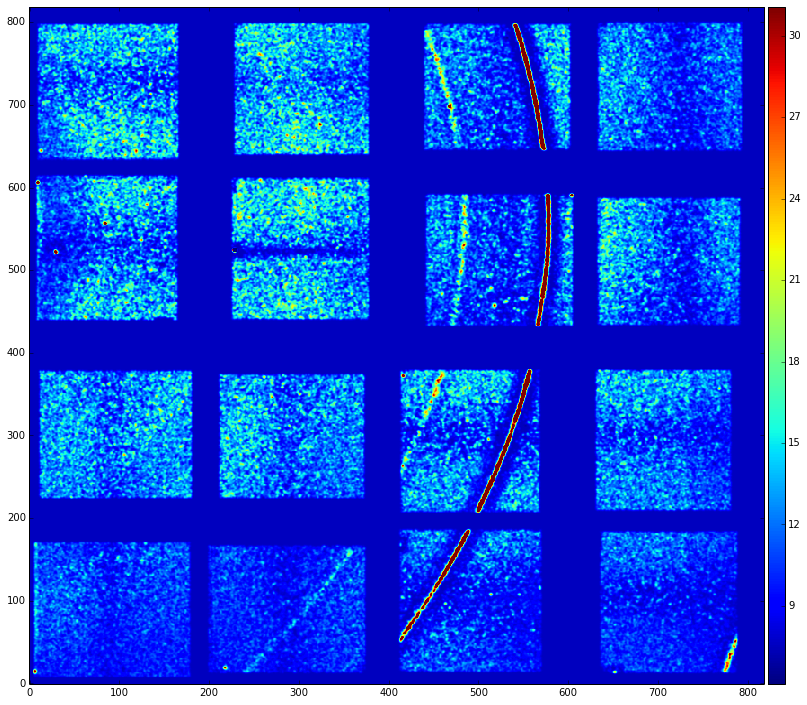

In [7]:
plot_xrd(MgO_ref_short, compound_list = ['MgO'], normalization = None, bgsub = False, plot_patterns = True, frame_processor = filtfunc)


### Compare to prior result:

In [23]:
%%HTML
<iframe width="900" height="800" frameborder="0" scrolling="no" src="https://plot.ly/~revilo222/237.embed"></iframe>

### quad1:

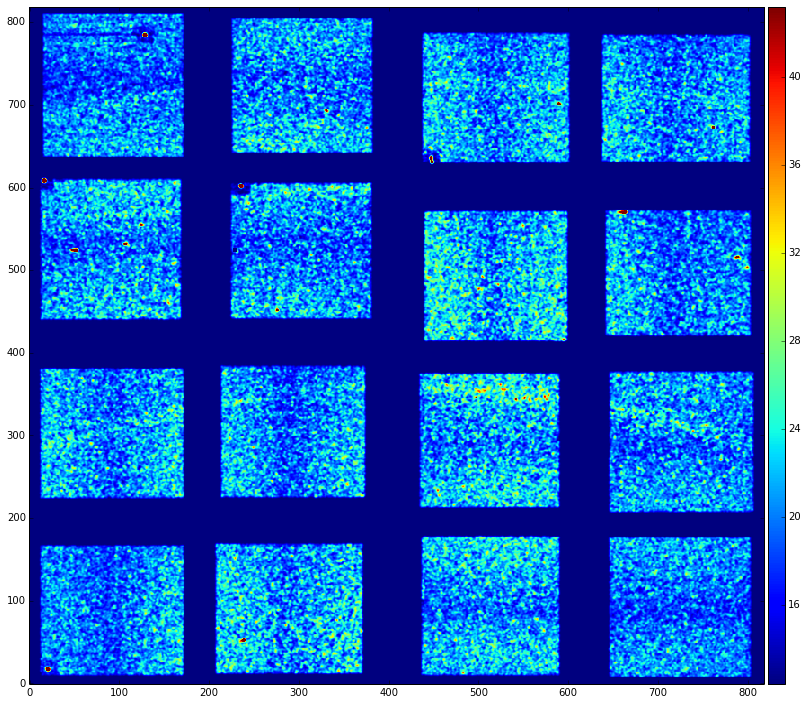

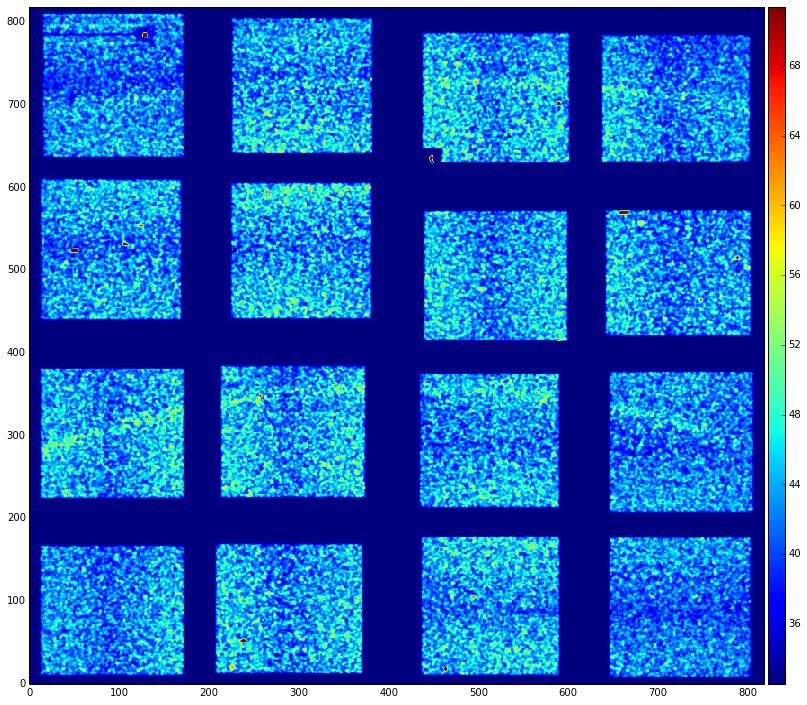

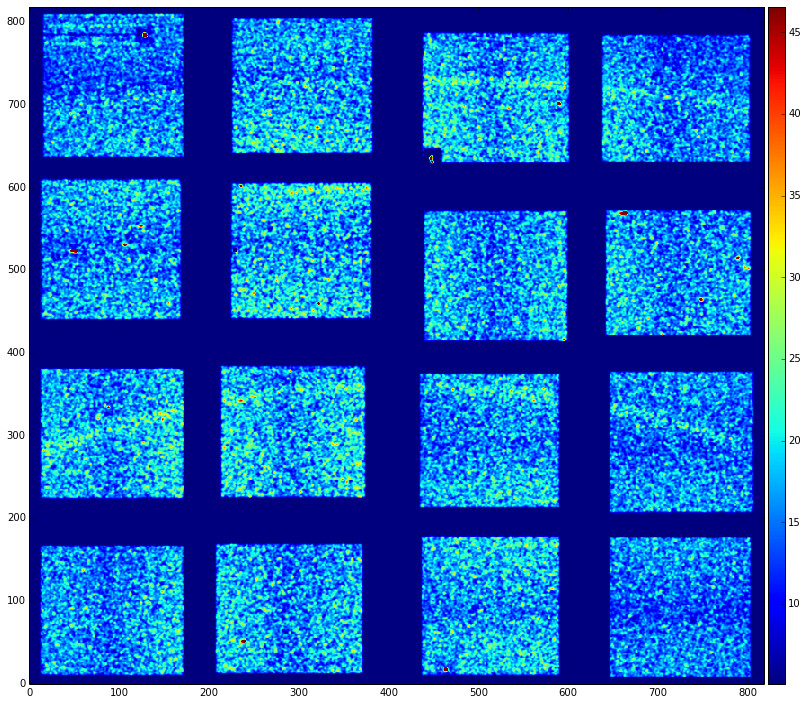

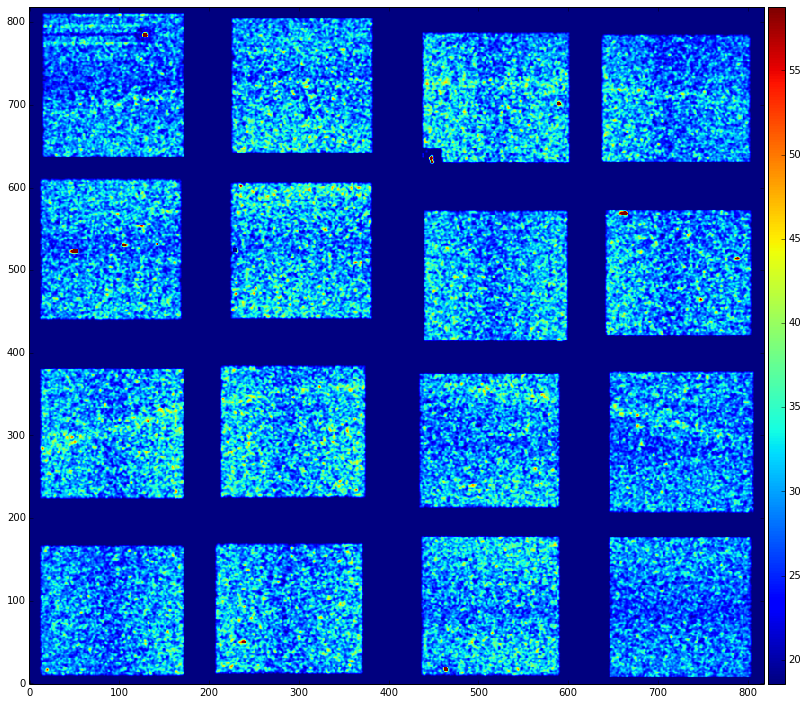

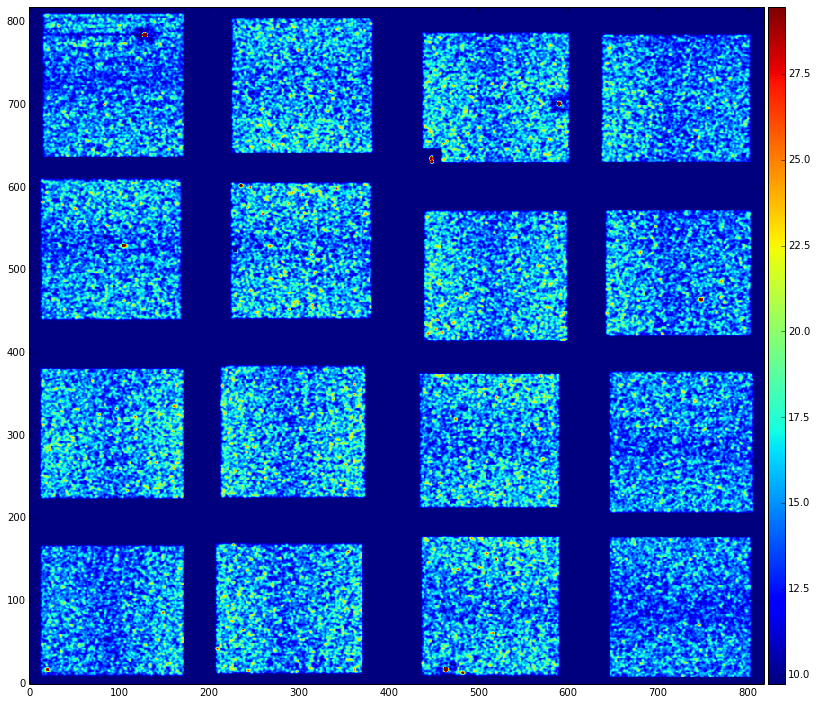

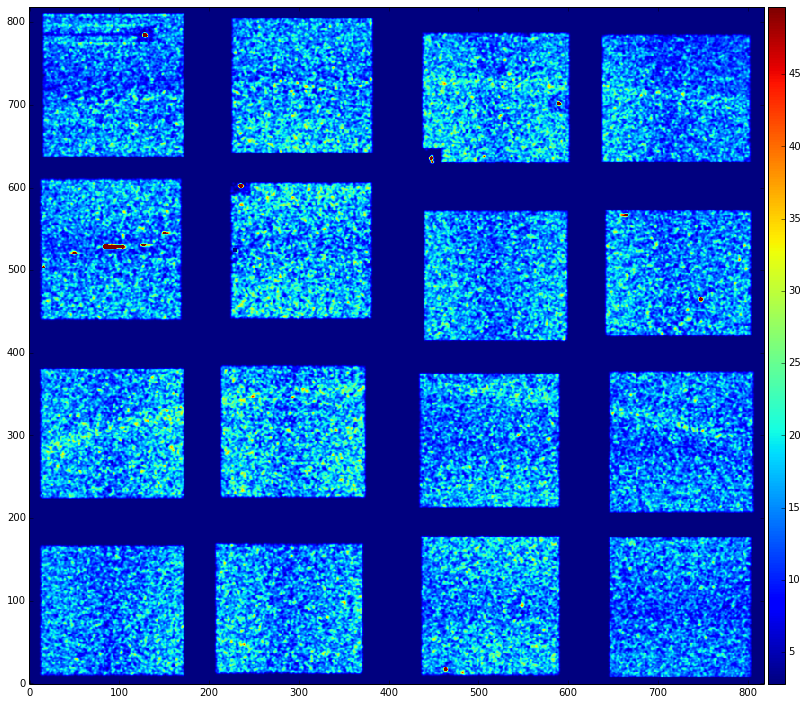

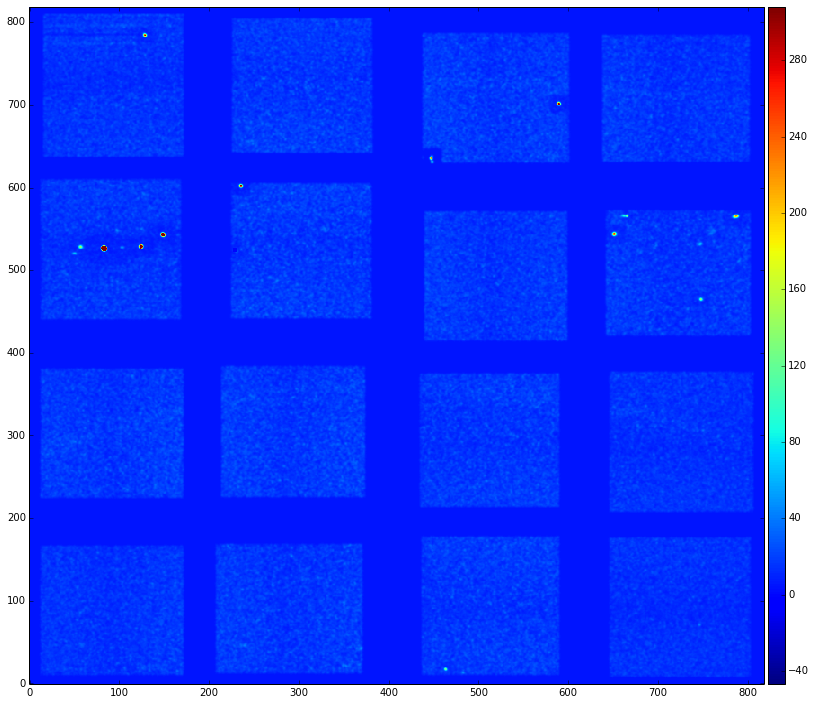

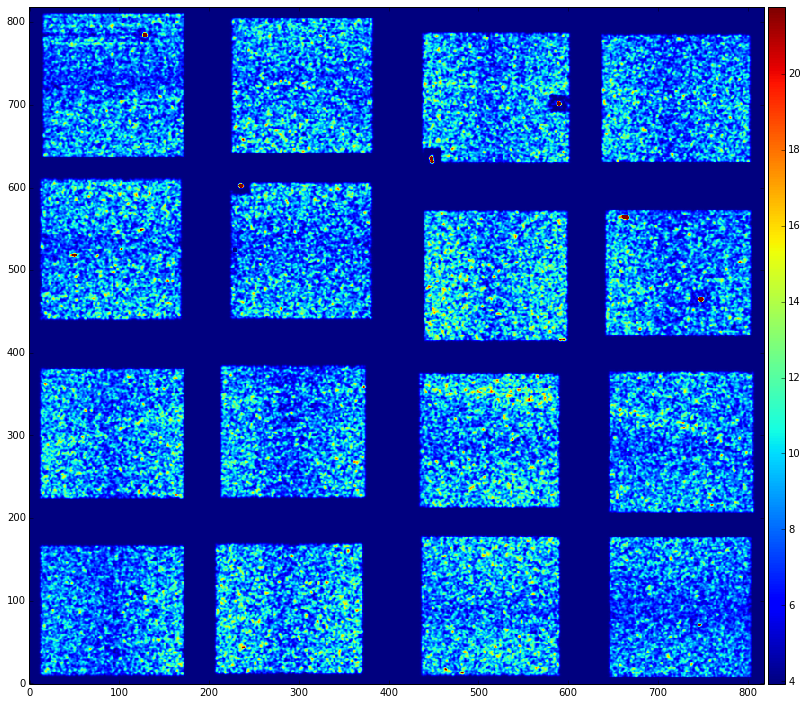

In [9]:
plot_xrd(MgO_ref_short, detectors = ['quad1'], compound_list = ['MgO'], normalization = None, bgsub = False,
         plot_patterns = True, frame_processor = filtfunc)


In [10]:
#config.detinfo_map['quad1'] = config.DetInfo(device_name='MecTargetChamber.0:Cspad.0',
#                                             geometry={'y0': 187, 'phi': 0, 'r': 910.4, 'x0': 409, 'alpha': 2.44874},
#                                             extra_masks=set(['../masks/quad1_mask_10.11.npy']), subregion_index=0)

#from dataccess import utils, query, mec, datashow
#datashow.main(['916'], 'quad1', fiducials = [109.5, 130.])

In [ ]:
plot_xrd([r916], compound_list = ['MgO'], normalization = None, bgsub = False, plot_patterns = True, frame_processor = filtfunc)

## Combined powder pattern:

In [11]:
plot_xrd(MgO_ref_short, compound_list = ['MgO'], normalization = None, bgsub = False,
         plot_patterns = True, detectors = ['quad2', 'quad1'], frame_processor = filtfunc, show_image = False)

### Demonstrate normalization by peak fitting:

In [12]:
plot_xrd(MgO_ref_short, compound_list = ['MgO'], normalization = 'peak', bgsub = False,
         plot_patterns = True, detectors = ['quad2', 'quad1'], frame_processor = filtfunc, show_image = False)

## Bragg peak intensity progression (fully normalized)

In [14]:
progression = plot_xrd(MgO_ref_short_clean, compound_list = ['MgO'], normalization = 'peak',
        bgsub = False, plot_progression = True,  detectors = ['quad2', 'quad1'], 
        show_image = False, frame_processor = filtfunc)

### Normalized only by cold dataset:

In [17]:
progression = plot_xrd(MgO_ref_short_clean, compound_list = ['MgO'], normalization = None, show_image = False,
         bgsub = False, plot_progression = True,  detectors = ['quad2', 'quad1'])

### No normalization:

In [15]:
progression = plot_xrd(MgO_ref_short_clean, compound_list = ['MgO'], normalization = None, show_image = False,
         bgsub = False, plot_progression = True,  detectors = ['quad2', 'quad1'], inner_normalization = False)

## Search for signal intensity variations as a function of incident flux:

In [19]:
from dataccess import mec

def split_dataset(ds, suffix = ''):
    """Given a dataset ds, return two new datasets resulting from splitting it by pulse intensity"""
    mean_si = np.mean(ds.evaluate('si', mec.si_imarr_sum).flat_event_data())
    def below_mean(imarr, **kwargs):
        return mec.si_imarr_sum(imarr) < mean_si
    def above_mean(imarr, **kwargs):
        return not below_mean(imarr)
    label_base = '_'.join(map(str, ds.runs))
    ds_lower = query.DataSet(ds.runs, event_filter = below_mean, event_filter_detid = 'si', label = label_base + 'lower' + suffix)
    ds_upper = query.DataSet(ds.runs, event_filter = above_mean, event_filter_detid = 'si', label = label_base + 'upper' + suffix)
    return ds_lower, ds_upper

In [20]:
def plot_split(ds, suffix = '1'):
    td = ds.evaluate('si', event_data_getter = mec.si_imarr_sum)
    lower, upper = split_dataset(ds, suffix = suffix)
    return lower, upper, plot_xrd([lower, upper], compound_list = ['MgO'], normalization = None,
         bgsub = False, plot_progression = True,  detectors = ['quad2', 'quad1'], inner_normalization = True,
         show_image = False)

### Split each dataset (corresponding to one nominal incident flux value) into two. Sample histogram of per-event Si spectrometer signal for a single split:

In [22]:
from dataccess.summarymetrics import plt, histogram, scatter
lower, upper = split_dataset(MgO_ref_short_clean[1])
histogram([lower, upper], 'si', event_data_getter=mec.si_imarr_sum, separate = True)

### Now plot the peak intensity progressions:

In [77]:
split_progression = [plot_split(ds, suffix = 'v' + str(i)) for i, ds in enumerate(MgO_ref_short_clean[:-1] + [query.DataSet([922], label = 'r922')])]

### Check peak fits for a single split:

In [79]:
lower, upper = split_progression[-2][:2]

In [87]:
plot_xrd([lower, upper], compound_list = ['MgO'], normalization = None, bgsub = False, plot_patterns = True, 
        frame_processor = filtfunc, show_image = False)


In [89]:
plot_xrd([lower, upper], compound_list = ['MgO'], normalization = 'peak', bgsub = False, plot_patterns = True,
         frame_processor = filtfunc, inner_normalization = False, show_image = False, recompute2 = True)